# Pattern Recognition 3 - Points and Neighbourhoods

**Objectives**:

* Detect points of interest in an image
* Extract neighbourhood descriptors
* Use descriptors for clustering and matching

## Points of interest

In the previous labs, we have analyzed the images either using "object descriptors" (area, eccentricity, moments of segmented object) or "image descriptors" (based on all the pixels of the image). Another way of approaching an image analysis problem is to first look for "interesting points".

What makes a point *interesting* will highly depend on the application. Common examples are **corners**, or **local extrema**.

Starting from the `mitosis.bmp` image, find or create a **point detector** that will detect the nuclei of the cells.

> *Hint: it may be easier to do so in a different color space...*

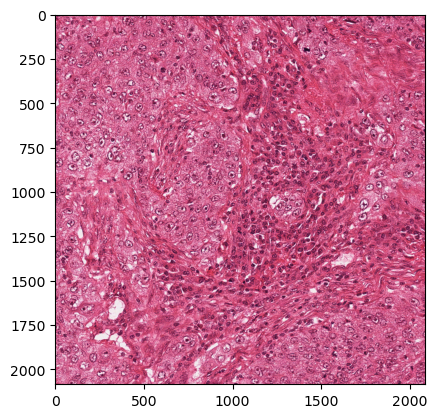

In [2]:
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread
%matplotlib inline

im = imread('mitosis.bmp')
plt.figure()
plt.imshow(im)
plt.show()

find a way to segmente/separate 2 types of different tissues qu'on peut voir. certaines cells sont regular space et d'autres allignées, ... bref 2 types cell et on veut automatiquement les séparer. et pour ça on veut use region descriptors pour ça. Ici idée d'utiliser clustering approach pour trouver features vectors pour certaines regions et ensuite avoir 2 clusters qui match les régions qu'on a.

**à 2min : il explique diff entre tp1, 2 et 3 !! super important, bien réecouter. il explique esnuite comment trouver les points d'interet (coin ,max, min, ...) et d'autres trucs, bien ecouter**

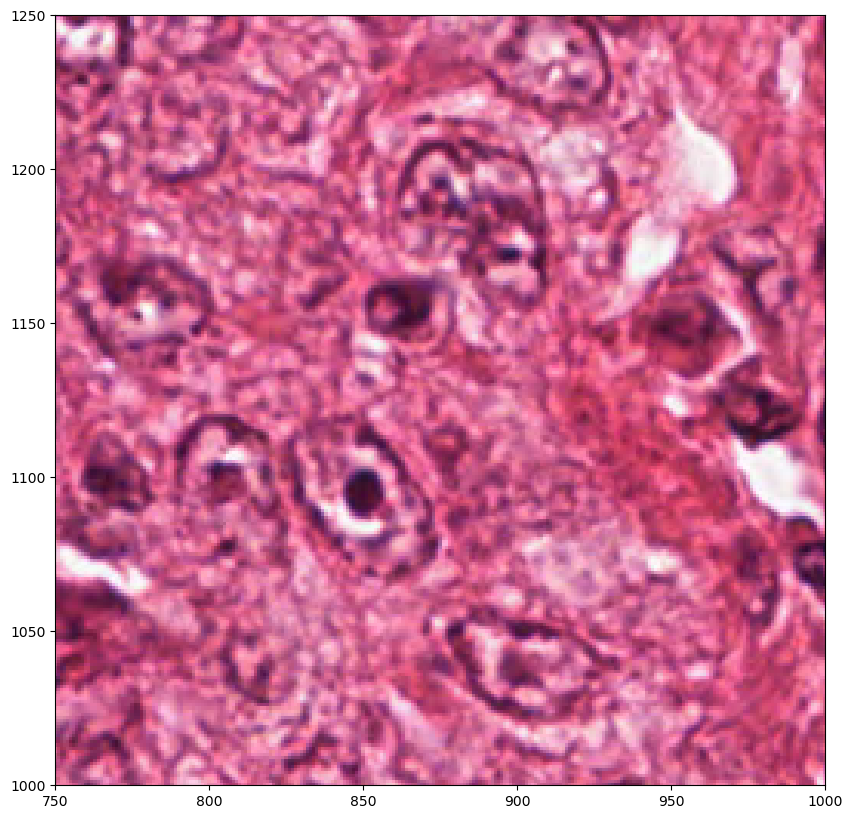

In [3]:
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread
%matplotlib inline

im = imread('mitosis.bmp')
plt.figure(figsize=(10, 10))
plt.imshow(im)
plt.xlim([750, 1000])
plt.ylim([1000, 1250])
plt.show()


In [4]:
# Les noyaux plus d'infos que le random noise à côté, donc bon points d'interêt

<Figure size 640x480 with 0 Axes>

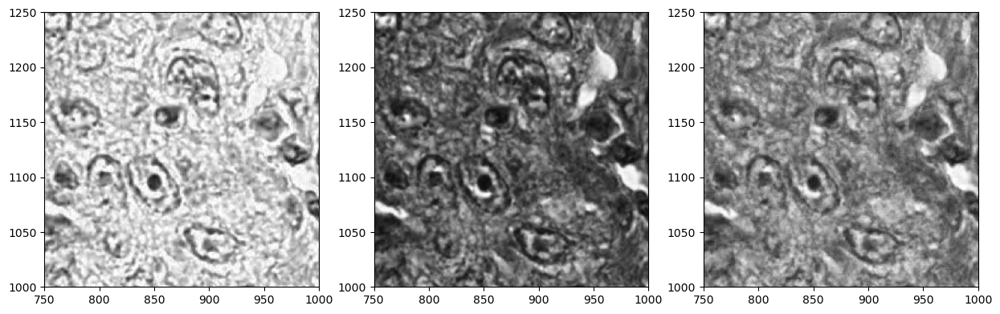

In [6]:
plt.gray()
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(im[..., 0])
plt.xlim([750, 1000])
plt.ylim([1000, 1250])

plt.subplot(1, 3, 2)
plt.imshow(im[..., 1])
plt.xlim([750, 1000])
plt.ylim([1000, 1250])

plt.subplot(1, 3, 3)
plt.imshow(im[..., 2])
plt.xlim([750, 1000])
plt.ylim([1000, 1250])

plt.show()


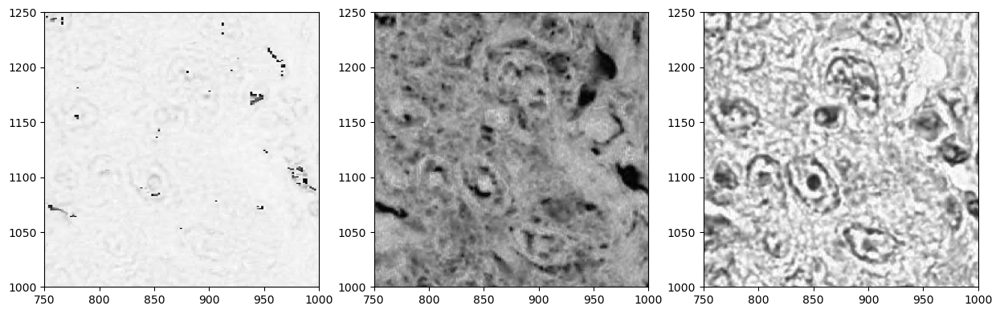

In [7]:
from skimage.color import rgb2hsv

hsv = rgb2hsv(im)
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(hsv[..., 0])
plt.xlim([750, 1000])
plt.ylim([1000, 1250])

plt.subplot(1, 3, 2)
plt.imshow(hsv[..., 1])
plt.xlim([750, 1000])
plt.ylim([1000, 1250])

plt.subplot(1, 3, 3)
plt.imshow(hsv[..., 2])
plt.xlim([750, 1000])
plt.ylim([1000, 1250])

plt.show()


In [9]:
# Value channel de HSV permet de mesurer luminosité, donc bien pou rtrouver point of interest. red channel aussi bien. but détecter les noyaux du coup.

(2960, 2)


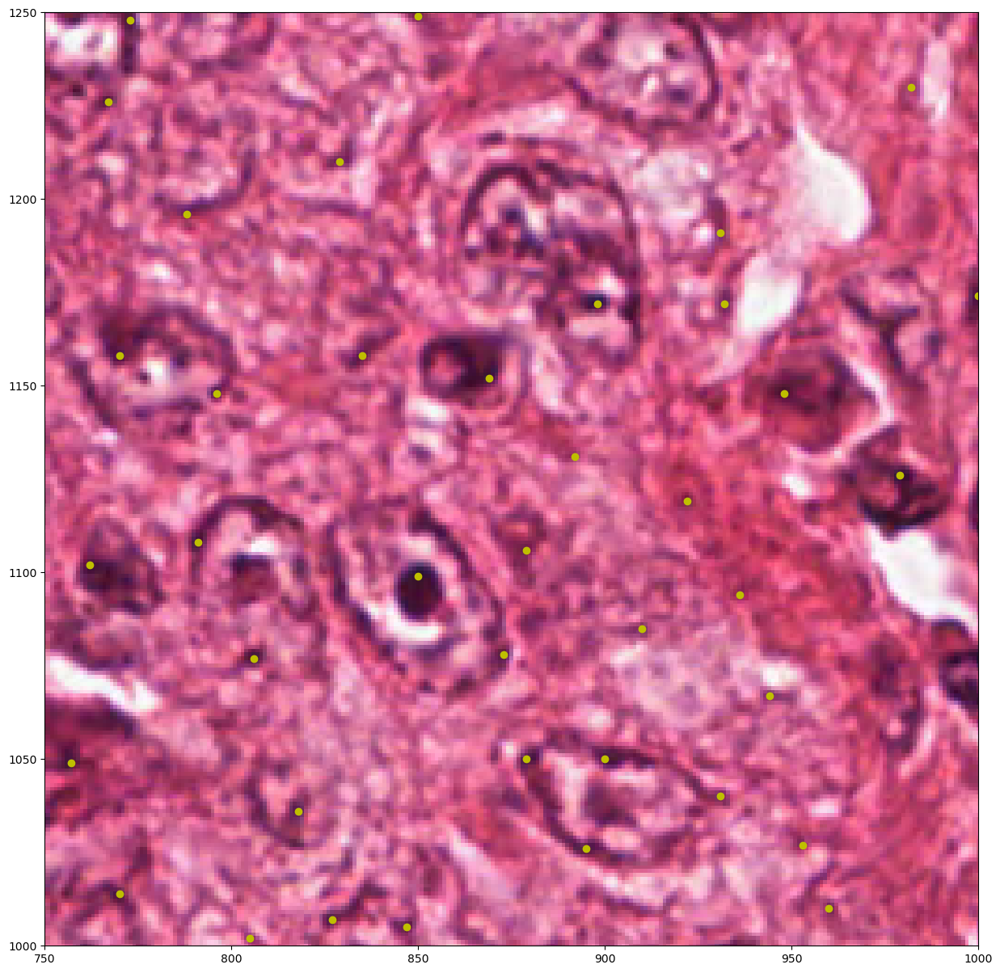

In [11]:
from skimage.feature import peak_local_max

plm = peak_local_max(1 - hsv[..., 2], min_distance=15, threshold_rel=0.3)
print(plm.shape)
plt.figure(figsize=(15, 15))
plt.imshow(im)
plt.plot(plm[:, 1], plm[:, 0], 'yo', alpha=1)
plt.xlim([750, 1000])
plt.ylim([1000, 1250])
plt.show()


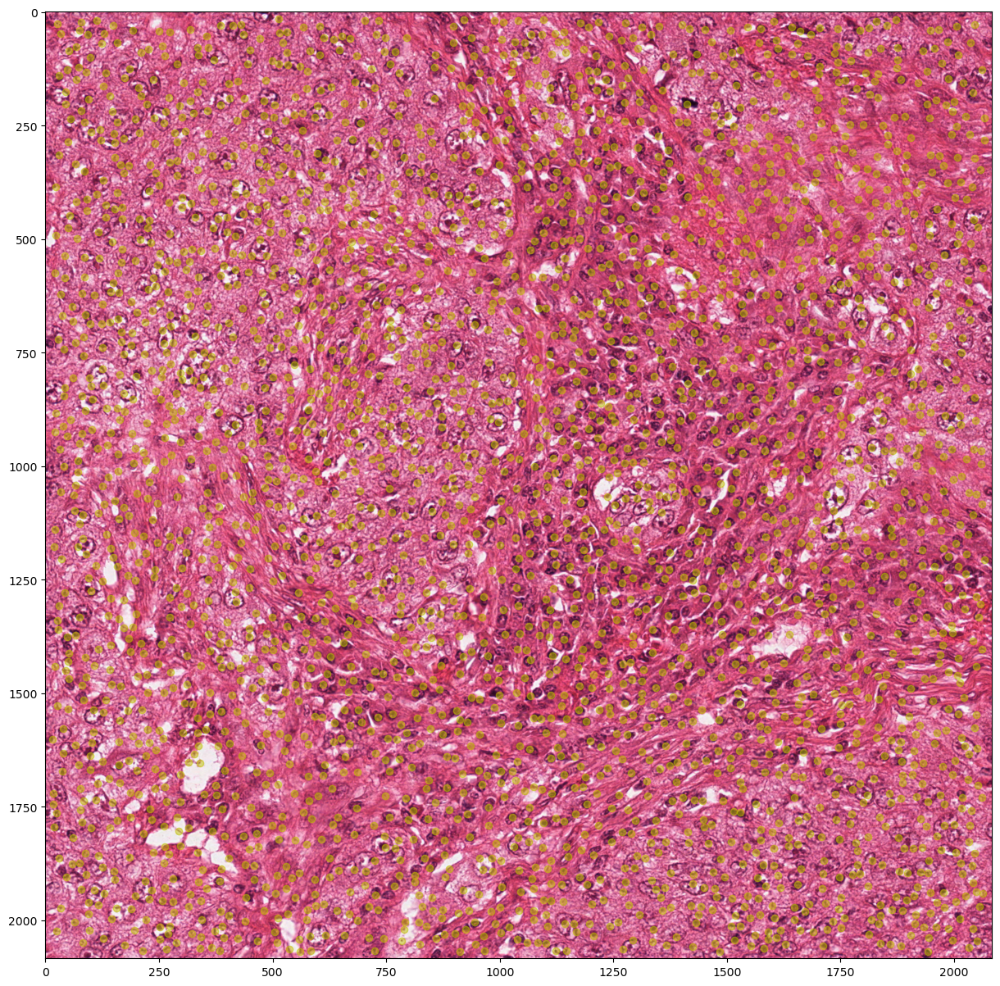

In [13]:
plt.figure(figsize=(15, 15))
plt.imshow(im)
plt.plot(plm[:, 1], plm[:, 0], 'yo', alpha=0.5)
plt.show()


on voit points speread out qui vont tendre à être proche d'être noyau/cell donc quand on compute descriptiors autour de ces régions, on espère que ça donne infos bonnes pour faire classification. bon pas parfait mais bon

Next step, ittérer sur les points, regarder voisinage (choisir size du voisinage) et compute descriptor et qui nous semble pour faire notre classifcation. par exemple ici, c'est prendre color histogram. et Kmeans va permettre de cluster les tpyes cell, tissues, ... donc est ce qu'on obtient classification qu'on veut.

## Descriptors

The goal of *descriptors* is to represent the region surrounding the point of interest in a way that allow our algorithm to best perform its task. For instance, the BRIEF descriptor will compare pairs of pixels in the given neighbourhood and create a binary descriptor representing the result of all these comparison. This kind of descriptor will tend to create a unique signature in a grayscale image, and is very useful for applications such as matching for stereo-vision or for video tracking.

Other types of descriptors can be based on the texture (for instance with local Fourier transforms) or on local histograms.

* Using the points detected before, **extract neighbourhood patches** and **compute the concatenated color histogram** as a descriptor (meaning a 256+256+256 = size 768 vector, with the first 256 values corresponding to the R histogram, etc...).
* Use the [KMeans](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) class from `scikit-learn` to cluster the points of interest depending on their descriptor. Can you identify clusters representing the type of tissue of the cell?

In [14]:
from sklearn.cluster import KMeans

def compute_histogram(patch):
    rgb_histogram = np.zeros((768,))

    for v in range(256):
        rgb_histogram[v] = (patch[..., 0] == v).sum()
        rgb_histogram[v + 256] = (patch[..., 1] == v).sum()
        rgb_histogram[v + 512] = (patch[..., 2] == v).sum()

    return rgb_histogram

def extract_descriptors(im, coords, neighbourhood_size=15):
    descriptors = []
    for row, col in coords:
        region = im[row - neighbourhood_size // 2 : row + neighbourhood_size // 2,
                    col - neighbourhood_size // 2 : col + neighbourhood_size // 2]
        descriptors.append(compute_histogram(region))
    return np.array(descriptors)

descriptors = extract_descriptors(im, plm)
print(descriptors.shape)


(2960, 768)


In [ ]:
### réecouter 29 minutes

In [15]:
print(descriptors[0])

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  2.  0.  1.  5.  4.  5.  7.  6.  6.  3.  5.  5.  6.  4.  4.  3.  2.  2.
  8.  3.  3.  3.  5.  4.  3.  4.  1.  4.  4.  3.  6.  3.  2.  7.  7.  4.
  1.  0.  2.  3.  1.  2.  5.  1.  0.  3.  0.  1.  2.  0.  2.  2.  0.  2.
  0.  2.  2.  0.  0.  2.  1.  0.  0.  1.  0.  1.  0.  0.  1.  0.  1.  0.
  0.  0.  0.  1.  0.  1.  0.  1.  0.  0.  1.  0.  0.  1.  1.  0.  0.  0.
  1.  1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0

In [16]:
# On veut 2 clusters bien réecouter 31min30 !! il explique principe général du code
km = KMeans(2) # specicify hyperparameters, on décri comment le clustering/classifier, ... est. 
km.fit(descriptors)

KMeans(n_clusters=2)

In [17]:
clusters = km.predict(descriptors)

In [20]:
print((clusters==0).sum(), (clusters == 1).sum())

1284 1676


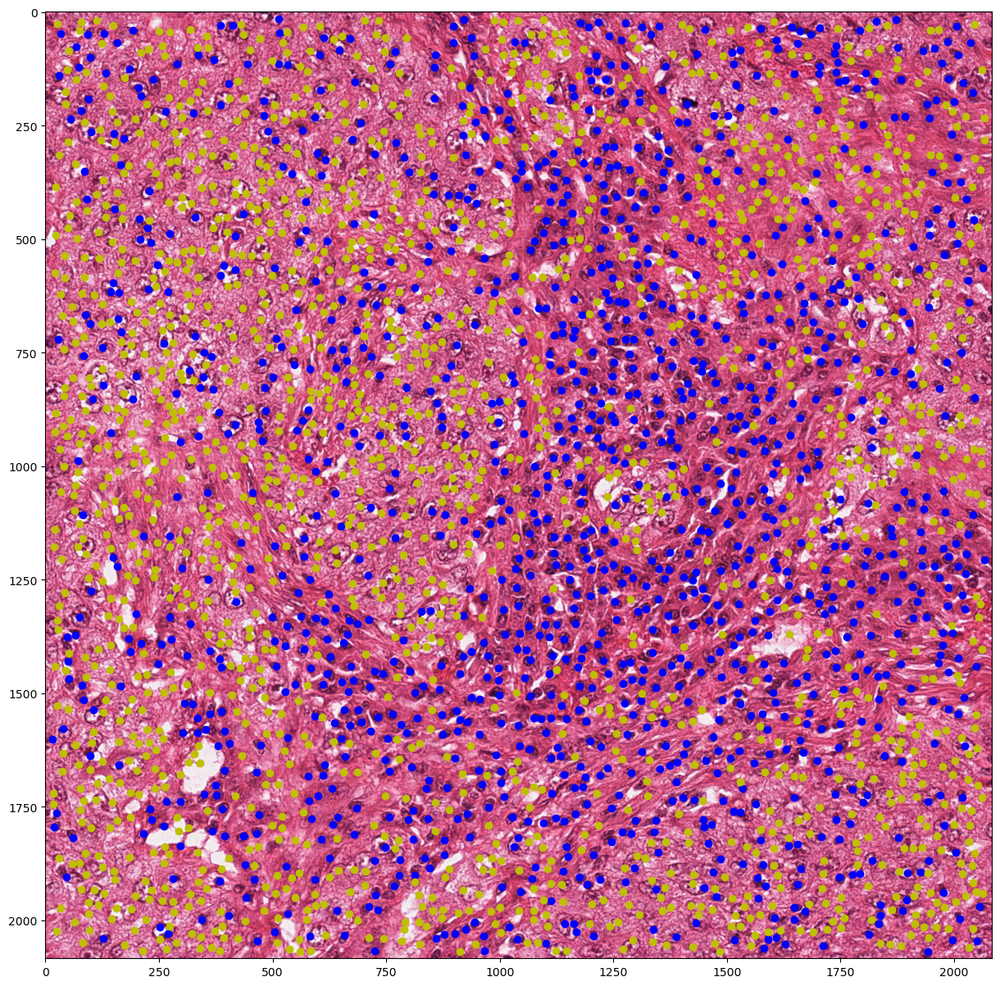

In [24]:
plt.figure(figsize=(15,15))
plt.imshow(im)
plt.plot(plm[clusters==0,1], plm[clusters==0,0], 'bo')
plt.plot(plm[clusters==1,1], plm[clusters==1,0], 'yo')
plt.show()

Pas si mal. mais pas pixel non plus. on pourrait ajouter orientation des borders, texture, quantité de bords, ... plein d'autres descripteurs possibles.

* Apply the same point detection and descriptors on the `mitosis2.bmp` image, and use the already trained KMeans to predict the clusters of the points in the new image.

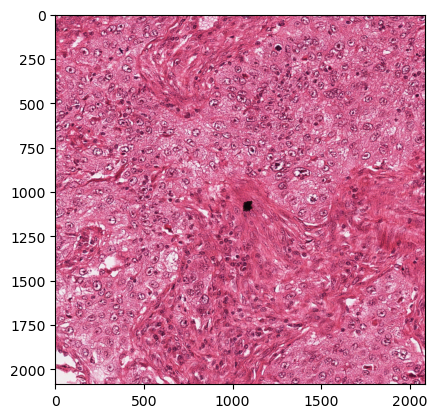

In [26]:
## Tester sur une autre image !classes determiné sur base des points, descripteurs. et est ce que ces clsuters sont generalisables sur nouvelles images.
## -- Your code here -- ##
im2 = imread('mitosis2.bmp')
plt.figure()
plt.imshow(im2)
plt.show()


In [27]:
hsv2 = rgb2hsv(im2)
plm2 = peak_local_max(1 - hsv2[..., 2], min_distance=10, threshold_rel=0.7)
print(plm2.shape)


(1480, 2)


(1480, 768)


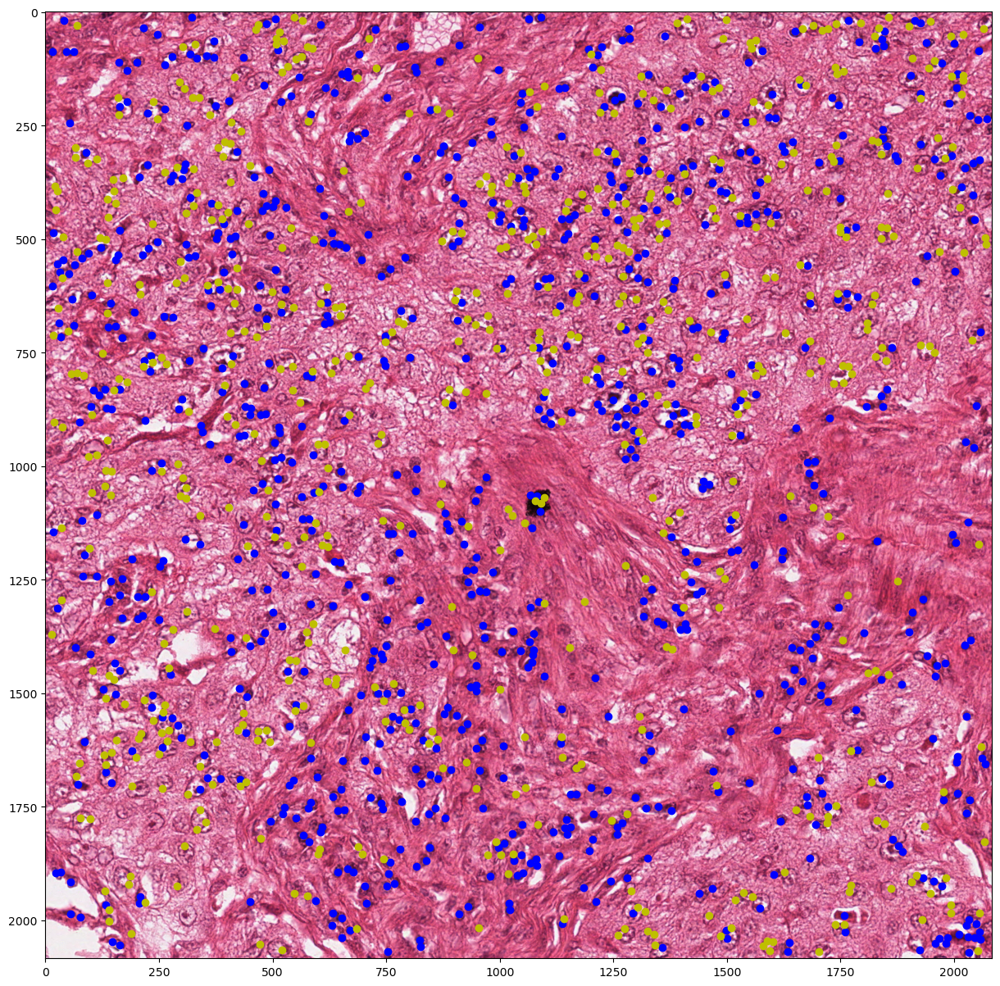

In [28]:
descriptors = extract_descriptors(im2, plm2)
print(descriptors.shape)  # (1480, 768)

clusters = km.predict(descriptors)

plt.figure(figsize=(15, 15))
plt.imshow(im2)
plt.plot(plm2[clusters == 0, 1], plm2[clusters == 0, 0], 'bo')
plt.plot(plm2[clusters == 1, 1], plm2[clusters == 1, 0], 'yo')
plt.show()


In [29]:
## decent results sans supervision, annotation ... en gros sans ML. 